# Dissolve Glaciers Polygons
This notebook dissolves the glacier polygons that are parts of ice caps or icefields into their glacier catchements. Not all regions contain ice caps. The regions that have ice caps and that are processed in this notebook are the following:

* Region 3
* Region 4
* Region 5
* Region 6
* Region XXX

The ice cap and icefield outlines were created by looking at the GLIMS Viewer map (http://www.glims.org/maps/glims) and manaully selecting lat/lon bounding box coordinates.

In [1]:
import os
import os.path as op
import sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Polygon
import rasterio as rio
from rasterio.plot import show
import earthpy.spatial as es
import warnings
warnings.filterwarnings("ignore")

# set working dir
HOME = op.join(op.expanduser("~"))
os.chdir(os.path.join(HOME, "git/wgms-glacier-project"))

module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
    
import scripts.wgms_scripts as ws

# ------------------------------------------------------------------------------------------------------
## Region 3 - Arctic Canada, North
Need to dissolve the main ice caps in this region. For example, Devon Ice Cap on Devon Island. For this region, will determine the 3 largest ice caps and then the 3 largest outlet glaciers in each of the ice caps.

#### Create the Ice Cap outlines to clip the area before dissolving

##### Devon Ice Cap

In [2]:
# Create a clipping polygon for Devon Ice Cap
# Create dataframe that holds the clipping box
devon_area_points = Polygon([(-85.4077, 75.6708), (-83.5950, 75.9402),
                              (-80.5078, 75.8841), (-78.8708, 75.4627), 
                              (-78.7390, 74.9037), (-80.6616, 74.3593), 
                              (-88.0774, 74.3859), (-88.2092, 75.1478), 
                              (-85.4077, 75.6708)])
devon_gdf = gpd.GeoDataFrame([1],
                              geometry=[devon_area_points],
                              crs={'init': 'epsg:4362'})

##### Prince of Wales Icefield

In [3]:
# Create a clipping polygon for Prince of Wales Icefield
# Create dataframe that holds the clipping box
pow_area_points = Polygon([(-81.7163, 79.1196), (-78.8818, 79.1940),
                           (-73.1030, 78.8084), (-76.4868, 77.2083), 
                           (-83.4741, 77.3198), (-81.7163, 79.1196)])
pow_gdf = gpd.GeoDataFrame([1],
                              geometry=[pow_area_points],
                              crs={'init': 'epsg:4362'})

##### Agassiz Ice Cap

In [4]:
# Create a clipping polygon for Agassiz Ice Cap
# Create dataframe that holds the clipping box
agassiz_area_points = Polygon([(-81.7163, 79.1196), (-83.1665, 80.5771),
                               (-68.3569, 81.6421), (-65.2368, 81.0949), 
                               (-70.3784, 79.0822), (-81.7163, 79.1196)])
agassiz_gdf = gpd.GeoDataFrame([1],
                              geometry=[agassiz_area_points],
                              crs={'init': 'epsg:4362'})

##### Norther Ellesmere Icefield/Ice Cap

In [5]:
# Create a clipping polygon for Agassiz Ice Cap
# Create dataframe that holds the clipping box
ellesmere_area_points = Polygon([(-94.7021, 81.9601), (-71.4990, 83.6381),
                                 (-59.9854, 82.5748), (-86.9238, 80.1787), 
                                 (-94.7021, 81.9601)])
ellesmere_gdf = gpd.GeoDataFrame([1],
                                 geometry=[ellesmere_area_points],
                                 crs={'init': 'epsg:4362'})

#### Open GLIMS and RGI Region 3 Data

In [6]:
# Open GLIMS region 3 shapefile
glims_region_3_fp = "data/glims/processed/cleaned/glims_region_3_cleaned.shp"
glims_polygons_r3 = gpd.read_file(glims_region_3_fp)

# Open RGI region 3 shapefile
rgi_polygons_r3 = ws.open_rgi_region(3)

### Dissolve Devon Ice Cap

##### GLIMS

GLIMS Devon Ice Cap area (km^2)
14856.257376256632


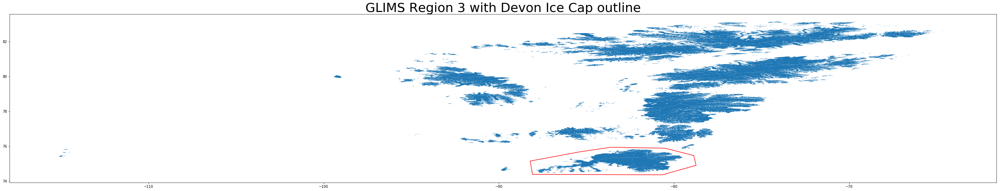

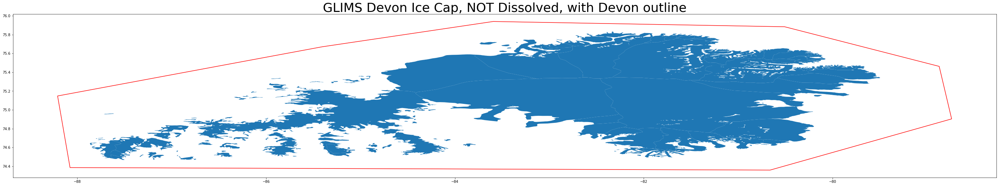

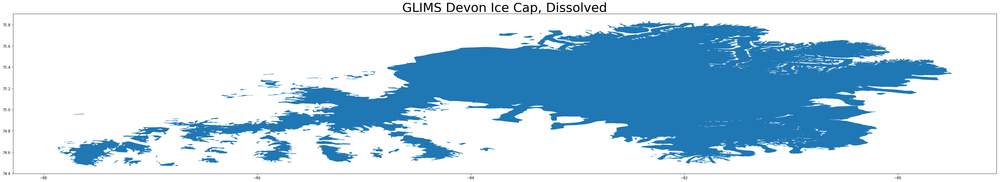

In [22]:
# Plot the devon ice cap on top of Region 3 to make sure it is correct
fig, ax1 = plt.subplots(figsize=(50, 50))
glims_polygons_r3.plot(ax=ax1)
devon_gdf.boundary.plot(ax=ax1, color='red')
ax1.set_title("GLIMS Region 3 with Devon Ice Cap outline", fontsize=36)

# Find the GLIMS outlines that lie within the devon outline
devon_glims_pip_mask = ws.pip(glims_polygons_r3, devon_gdf)

# Pass pip_mask into data to get the ones that are in the specified region
devon_glims_region = glims_polygons_r3.loc[devon_glims_pip_mask]

# Plot the GLIMS devon ice cap with the devon outline
fig, ax2 = plt.subplots(figsize=(50, 50))
devon_glims_region.plot(ax=ax2)
devon_gdf.boundary.plot(ax=ax2, color='red')
ax2.set_title("GLIMS Devon Ice Cap, NOT Dissolved, with Devon outline", fontsize=36)

# Dissolve the GLIMS devon ice cap
devon_glims_dissolve = devon_glims_region.dissolve(by="region_no")

# Plot the GLIMS devon ice cap dissolve
fig, ax3 = plt.subplots(figsize=(50, 50))
devon_glims_dissolve.plot(ax=ax3)
ax3.set_title("GLIMS Devon Ice Cap, Dissolved", fontsize=36)

# Determine area of devon glims dissolve
devon_glims_area = devon_glims_dissolve['geometry'].to_crs({'init': 'epsg:3338'}).area/10**6
print("GLIMS Devon Ice Cap area (km^2)")
print(devon_glims_area[3])

##### RGI

RGI Devon Ice Cap area (km^2):
14855.857053483109


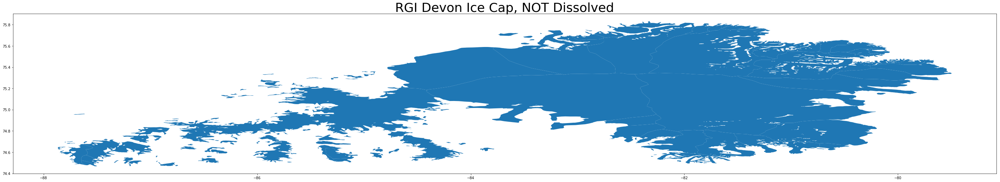

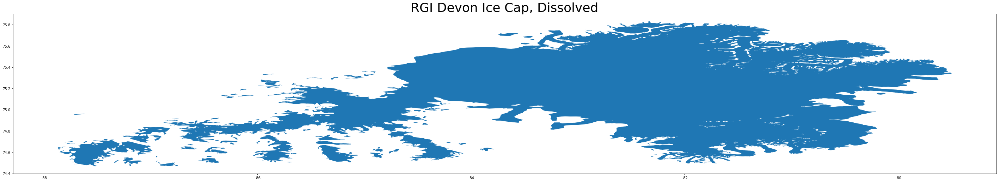

In [8]:
# Find the RGI outlines that lie within the devon outline
devon_rgi_pip_mask = ws.pip(rgi_polygons_r3, devon_gdf)

# Pass pip_mask into data to get the ones that are in the specified region
devon_rgi_region = rgi_polygons_r3.loc[devon_rgi_pip_mask]

# Plot the RGI devon ice cap
fig, ax1 = plt.subplots(figsize=(50, 50))
devon_rgi_region.plot(ax=ax1)
ax1.set_title("RGI Devon Ice Cap, NOT Dissolved", fontsize=36)

# Dissolve the RGI devon ice cap
devon_rgi_dissolve = devon_rgi_region.dissolve(by="O1Region")

# Plot the RGI devon ice cap dissolve
fig, ax2 = plt.subplots(figsize=(50, 50))
devon_rgi_dissolve.plot(ax=ax2)
ax2.set_title("RGI Devon Ice Cap, Dissolved", fontsize=36)

# Determine area of devon rgi dissolve
devon_rgi_area = devon_rgi_dissolve['geometry'].to_crs({'init': 'epsg:3338'}).area/10**6
print("RGI Devon Ice Cap area (km^2):")
print(devon_rgi_area[0])

### Dissolve Prince of Wales Icefield

##### GLIMS

GLIMS Prince of Wales area (km^2)
19142.27179102177


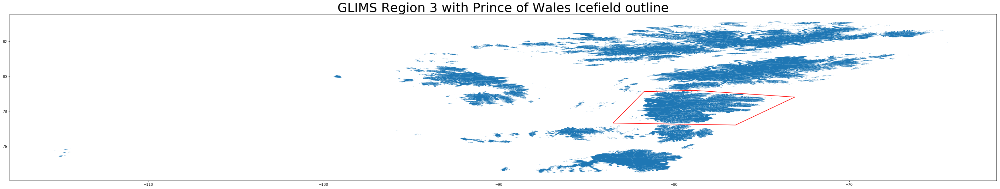

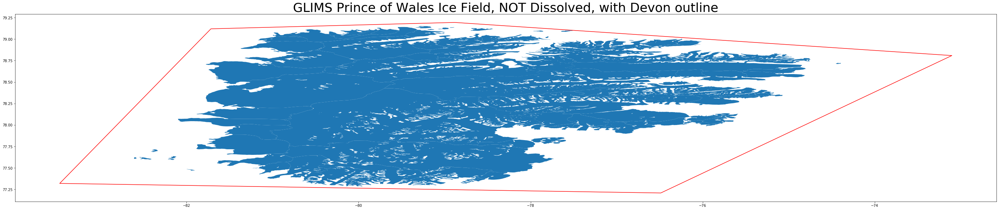

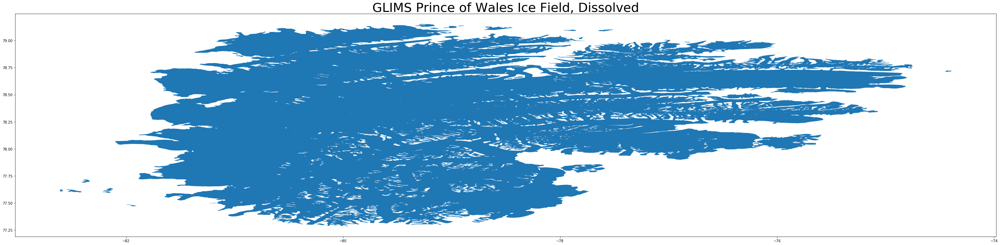

In [9]:
# Plot the prince of wales icefield on top of Region 3 to make sure it is correct
fig, ax1 = plt.subplots(figsize=(50, 50))
glims_polygons_r3.plot(ax=ax1)
pow_gdf.boundary.plot(ax=ax1, color='red')
ax1.set_title("GLIMS Region 3 with Prince of Wales Icefield outline", fontsize=36)

# Find the GLIMS outlines that lie within the prince of wales outline
pow_glims_pip_mask = ws.pip(glims_polygons_r3, pow_gdf)

# Pass pip_mask into data to get the ones that are in the specified region
pow_glims_region = glims_polygons_r3.loc[pow_glims_pip_mask]

# Plot the GLIMS prince of wales icefield with the pow outline
fig, ax2 = plt.subplots(figsize=(50, 50))
pow_glims_region.plot(ax=ax2)
pow_gdf.boundary.plot(ax=ax2, color='red')
ax2.set_title("GLIMS Prince of Wales Ice Field, NOT Dissolved, with Devon outline", fontsize=36)

# Dissolve the GLIMS prince of wales icefield
# The prince of wales region has some ill formed outlines. Must buffer them first before dissolving
pow_glims_region['geometry'] = pow_glims_region.buffer(0)
pow_glims_dissolve = pow_glims_region.dissolve(by="region_no")

# Plot the GLIMS devon ice cap dissolve
fig, ax3 = plt.subplots(figsize=(50, 50))
pow_glims_dissolve.plot(ax=ax3)
ax3.set_title("GLIMS Prince of Wales Ice Field, Dissolved", fontsize=36)

# Determine area of devon glims dissolve
pow_glims_area = pow_glims_dissolve['geometry'].to_crs({'init': 'epsg:3338'}).area/10**6
print("GLIMS Prince of Wales area (km^2)")
print(pow_glims_area[3])

##### RGI

RGI Prince of Wales Icefield area (km^2):
19141.936237131285


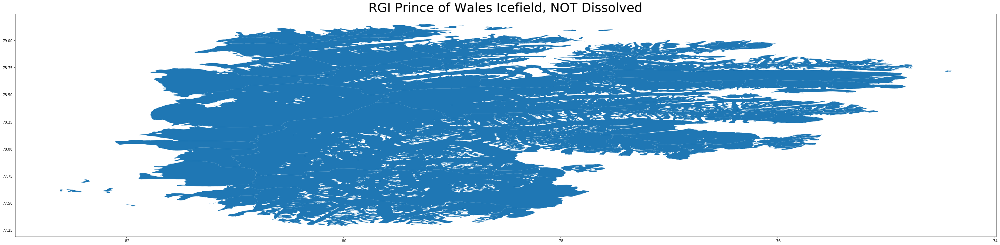

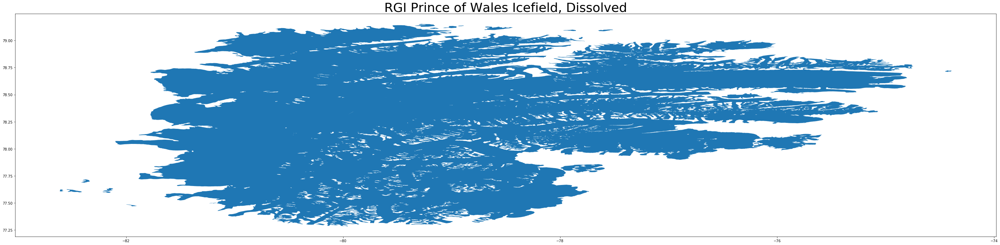

In [10]:
# Find the RGI outlines that lie within the pow outline
pow_rgi_pip_mask = ws.pip(rgi_polygons_r3, pow_gdf)

# Pass pip_mask into data to get the ones that are in the specified region
pow_rgi_region = rgi_polygons_r3.loc[pow_rgi_pip_mask]

# Plot the RGI prince of wales icefield
fig, ax1 = plt.subplots(figsize=(50, 50))
pow_rgi_region.plot(ax=ax1)
ax1.set_title("RGI Prince of Wales Icefield, NOT Dissolved", fontsize=36)

# Dissolve the RGI pow ice cap
pow_rgi_dissolve = pow_rgi_region.dissolve(by="O1Region")

# Plot the RGI pow ice cap dissolve
fig, ax2 = plt.subplots(figsize=(50, 50))
pow_rgi_dissolve.plot(ax=ax2)
ax2.set_title("RGI Prince of Wales Icefield, Dissolved", fontsize=36)

# Determine area of pow rgi dissolve
pow_rgi_area = pow_rgi_dissolve['geometry'].to_crs({'init': 'epsg:3338'}).area/10**6
print("RGI Prince of Wales Icefield area (km^2):")
print(pow_rgi_area[0])

### Dissolve Agassiz Ice Cap

##### GLIMS

GLIMS Agassiz Ice Cap area (km^2)
21120.310421126796


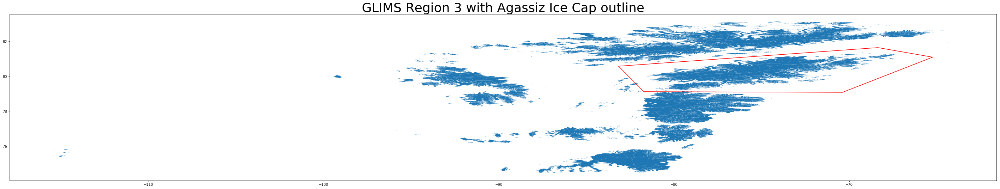

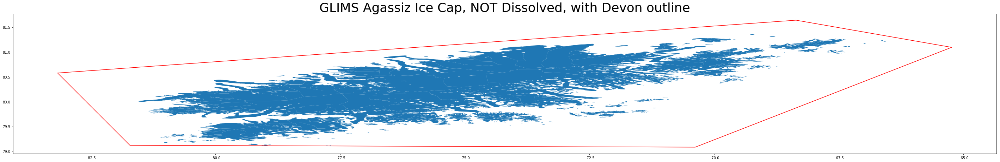

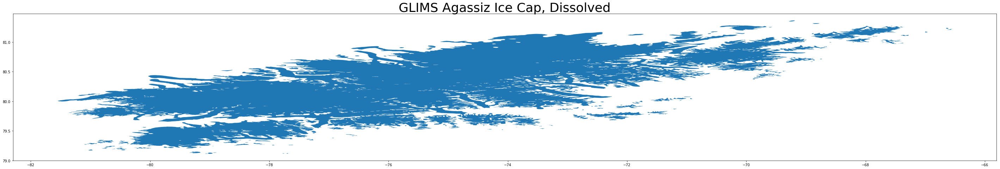

In [23]:
# Plot the agassiz ice cap on top of Region 3 to make sure it is correct
fig, ax1 = plt.subplots(figsize=(50, 50))
glims_polygons_r3.plot(ax=ax1)
agassiz_gdf.boundary.plot(ax=ax1, color='red')
ax1.set_title("GLIMS Region 3 with Agassiz Ice Cap outline", fontsize=36)

# Find the GLIMS outlines that lie within the agassiz outline
agassiz_glims_pip_mask = ws.pip(glims_polygons_r3, agassiz_gdf)

# Pass pip_mask into data to get the ones that are in the specified region
agassiz_glims_region = glims_polygons_r3.loc[agassiz_glims_pip_mask]

# Plot the GLIMS agassiz ice cap with the agassiz outline
fig, ax2 = plt.subplots(figsize=(50, 50))
agassiz_glims_region.plot(ax=ax2)
agassiz_gdf.boundary.plot(ax=ax2, color='red')
ax2.set_title("GLIMS Agassiz Ice Cap, NOT Dissolved, with Devon outline", fontsize=36)

# Dissolve the GLIMS agassiz ice cap
# The agassiz region has some ill formed outlines. Must buffer them first before dissolving
agassiz_glims_region['geometry'] = agassiz_glims_region.buffer(0)
agassiz_glims_dissolve = agassiz_glims_region.dissolve(by="region_no")

# Plot the GLIMS agassiz ice cap dissolve
fig, ax3 = plt.subplots(figsize=(50, 50))
agassiz_glims_dissolve.plot(ax=ax3)
ax3.set_title("GLIMS Agassiz Ice Cap, Dissolved", fontsize=36)

# Determine area of agassiz glims dissolve
agassiz_glims_area = agassiz_glims_dissolve['geometry'].to_crs({'init': 'epsg:3338'}).area/10**6
print("GLIMS Agassiz Ice Cap area (km^2)")
print(agassiz_glims_area[3])

##### RGI

RGI Agassiz Ice Cap area (km^2):
21127.447999003147


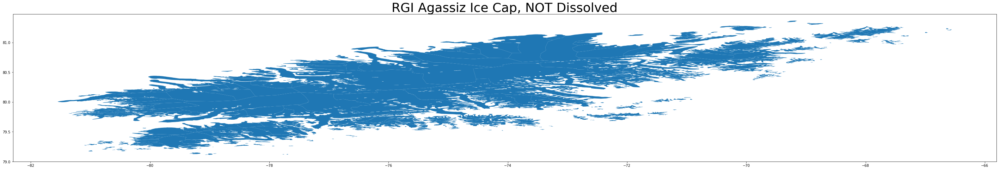

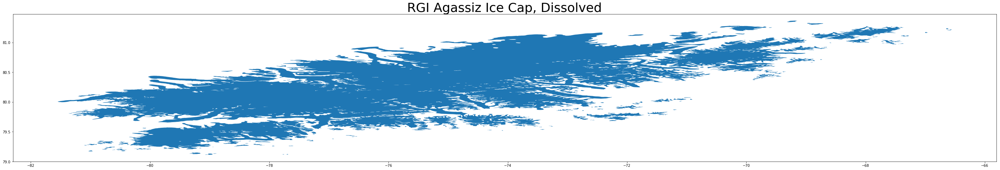

In [12]:
# Find the RGI outlines that lie within the agassiz outline
agassiz_rgi_pip_mask = ws.pip(rgi_polygons_r3, agassiz_gdf)

# Pass pip_mask into data to get the ones that are in the specified region
agassiz_rgi_region = rgi_polygons_r3.loc[agassiz_rgi_pip_mask]

# Plot the RGI agassiz icecap
fig, ax1 = plt.subplots(figsize=(50, 50))
agassiz_rgi_region.plot(ax=ax1)
ax1.set_title("RGI Agassiz Ice Cap, NOT Dissolved", fontsize=36)

# Dissolve the RGI agassiz ice cap
agassiz_rgi_dissolve = agassiz_rgi_region.dissolve(by="O1Region")

# Plot the RGI agassiz ice cap dissolve
fig, ax2 = plt.subplots(figsize=(50, 50))
agassiz_rgi_dissolve.plot(ax=ax2)
ax2.set_title("RGI Agassiz Ice Cap, Dissolved", fontsize=36)

# Determine area of agassiz rgi dissolve
agassiz_rgi_area = agassiz_rgi_dissolve['geometry'].to_crs({'init': 'epsg:3338'}).area/10**6
print("RGI Agassiz Ice Cap area (km^2):")
print(agassiz_rgi_area[0])

### Dissolve Northern Ellesmere Ice Cap

##### GLIMS

GLIMS Ellesmere Ice Cap area (km^2)
27220.645284956212


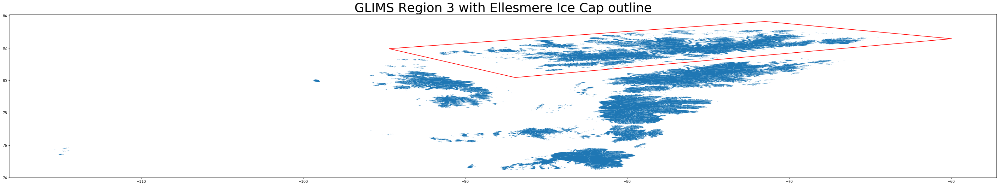

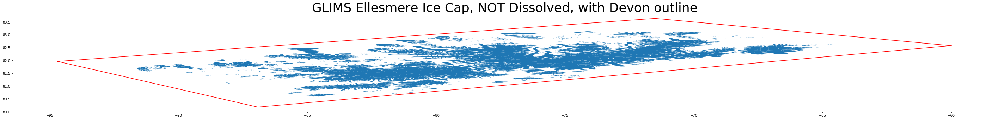

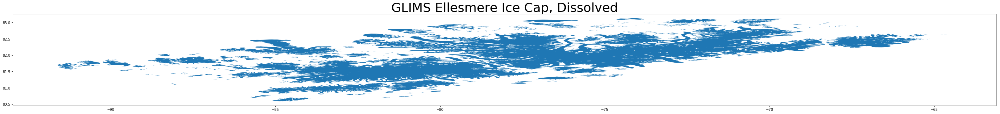

In [24]:
# Plot the ellesmere ice cap on top of Region 3 to make sure it is correct
fig, ax1 = plt.subplots(figsize=(50, 50))
glims_polygons_r3.plot(ax=ax1)
ellesmere_gdf.boundary.plot(ax=ax1, color='red')
ax1.set_title("GLIMS Region 3 with Ellesmere Ice Cap outline", fontsize=36)

# Find the GLIMS outlines that lie within the ellesmere outline
ellesmere_glims_pip_mask = ws.pip(glims_polygons_r3, ellesmere_gdf)

# Pass pip_mask into data to get the ones that are in the specified region
ellesmere_glims_region = glims_polygons_r3.loc[ellesmere_glims_pip_mask]

# Plot the GLIMS ellesmere ice cap with the agassiz outline
fig, ax2 = plt.subplots(figsize=(50, 50))
ellesmere_glims_region.plot(ax=ax2)
ellesmere_gdf.boundary.plot(ax=ax2, color='red')
ax2.set_title("GLIMS Ellesmere Ice Cap, NOT Dissolved, with Devon outline", fontsize=36)

# Dissolve the GLIMS agassiz ice cap
# The ellesmere region has some ill formed outlines. Must buffer them first before dissolving
ellesmere_glims_region['geometry'] = ellesmere_glims_region.buffer(0)
ellesmere_glims_dissolve = ellesmere_glims_region.dissolve(by="region_no")

# Plot the GLIMS ellesmere ice cap dissolve
fig, ax3 = plt.subplots(figsize=(50, 50))
ellesmere_glims_dissolve.plot(ax=ax3)
ax3.set_title("GLIMS Ellesmere Ice Cap, Dissolved", fontsize=36)

# Determine area of ellesmere glims dissolve
ellesmere_glims_area = ellesmere_glims_dissolve['geometry'].to_crs({'init': 'epsg:3338'}).area/10**6
print("GLIMS Ellesmere Ice Cap area (km^2)")
print(ellesmere_glims_area[3])

##### RGI

RGI Ellesmere Ice Cap area (km^2):
27203.053195943565


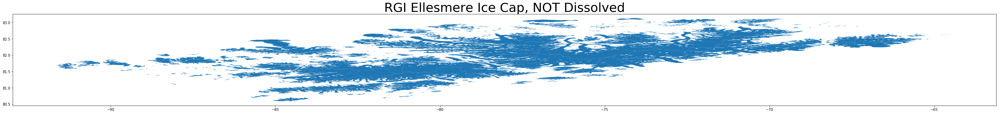

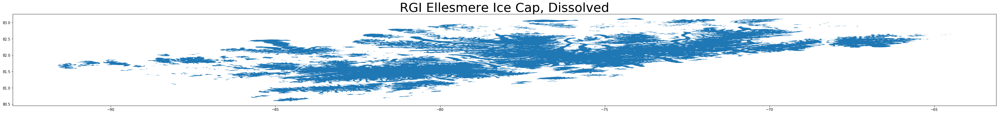

In [14]:
# Find the RGI outlines that lie within the ellesmere outline
ellesmere_rgi_pip_mask = ws.pip(rgi_polygons_r3, ellesmere_gdf)

# Pass pip_mask into data to get the ones that are in the specified region
ellesmere_rgi_region = rgi_polygons_r3.loc[ellesmere_rgi_pip_mask]

# Plot the RGI ellesmere icecap
fig, ax1 = plt.subplots(figsize=(50, 50))
ellesmere_rgi_region.plot(ax=ax1)
ax1.set_title("RGI Ellesmere Ice Cap, NOT Dissolved", fontsize=36)

# Dissolve the RGI ellesmere ice cap
ellesmere_rgi_dissolve = ellesmere_rgi_region.dissolve(by="O1Region")

# Plot the RGI ellesmere ice cap dissolve
fig, ax2 = plt.subplots(figsize=(50, 50))
ellesmere_rgi_dissolve.plot(ax=ax2)
ax2.set_title("RGI Ellesmere Ice Cap, Dissolved", fontsize=36)

# Determine area of ellesmere rgi dissolve
ellesmere_rgi_area = ellesmere_rgi_dissolve['geometry'].to_crs({'init': 'epsg:3338'}).area/10**6
print("RGI Ellesmere Ice Cap area (km^2):")
print(ellesmere_rgi_area[0])

#### Save the Region 3 Ice Caps
Save both dissolved and not dissolved ice cap outlines to use later.

##### GLIMS

In [60]:
# Save GLIMS Region 3 dissolved ice caps if they don't already exist
# Save dissolved Devon ice cap
devon_dis_glims_fp = 'data/glims/processed/ice-caps/dissolved/devon-dissolved-outline_r3.shp'
if os.path.exists(devon_dis_glims_fp) == False:
    devon_glims_dissolve.to_file(driver='ESRI Shapefile', filename=devon_dis_glims_fp)

# Save dissolved Prince of Wales ice cap
pow_dis_glims_fp = 'data/glims/processed/ice-caps/dissolved/prince-wales-dissolved-outline_r3.shp'
if os.path.exists(pow_dis_glims_fp) == False:
    pow_glims_dissolve.to_file(driver='ESRI Shapefile', filename=pow_dis_glims_fp)

# Save dissolved Agassiz ice cap
agassiz_dis_glims_fp = 'data/glims/processed/ice-caps/dissolved/agassiz-dissolved-outline_r3.shp'
if os.path.exists(agassiz_dis_glims_fp) == False:
    agassiz_glims_dissolve.to_file(driver='ESRI Shapefile', filename=agassiz_dis_glims_fp)

# Save dissolved Ellesmere ice cap
ellesmere_dis_glims_fp = 'data/glims/processed/ice-caps/dissolved/ellesmere-dissolved-outline_r3.shp'
if os.path.exists(ellesmere_dis_glims_fp) == False:
    ellesmere_glims_dissolve.to_file(driver='ESRI Shapefile', filename=ellesmere_dis_glims_fp)

# Save GLIMS Region 3 NOT dissolved ice caps
# Save not dissolved Devon ice cap
devon_not_dis_glims_fp = 'data/glims/processed/ice-caps/not-dissolved/devon-outline_r3.shp'
if os.path.exists(devon_not_dis_glims_fp) == False:
    devon_glims_region.to_file(driver='ESRI Shapefile', filename=devon_not_dis_glims_fp)

# Save not dissolved Prince of Wales ice cap
pow_not_dis_glims_fp = 'data/glims/processed/ice-caps/not-dissolved/prince-wales-outline_r3.shp'
if os.path.exists(pow_not_dis_glims_fp) == False:
    pow_glims_region.to_file(driver='ESRI Shapefile', filename=pow_not_dis_glims_fp)

# Save not dissolved Agassiz ice cap
agassiz_not_dis_glims_fp = 'data/glims/processed/ice-caps/not-dissolved/agassiz-outline_r3.shp'
if os.path.exists(agassiz_not_dis_glims_fp) == False:
    agassiz_glims_region.to_file(driver='ESRI Shapefile', filename=agassiz_not_dis_glims_fp)

# Save not dissolved Ellesmere ice cap
ellesmere_not_dis_glims_fp = 'data/glims/processed/ice-caps/not-dissolved/ellesmere-outline_r3.shp'
if os.path.exists(ellesmere_not_dis_glims_fp) == False:
    ellesmere_glims_region.to_file(driver='ESRI Shapefile', filename=ellesmere_not_dis_glims_fp)

##### RGI

In [59]:
# Save RGI Region 3 dissolved ice caps if they don't already exist
# Save dissolved Devon ice cap
devon_dis_rgi_fp = 'data/rgi/processed/ice-caps/dissolved/devon-dissolved-outline_r3.shp'
if os.path.exists(devon_dis_rgi_fp) == False:
    devon_rgi_dissolve.to_file(driver='ESRI Shapefile', filename=devon_dis_rgi_fp)

# Save dissolved Prince of Wales ice cap
pow_dis_rgi_fp = 'data/rgi/processed/ice-caps/dissolved/prince-wales-dissolved-outline_r3.shp'
if os.path.exists(pow_dis_rgi_fp) == False:
    pow_rgi_dissolve.to_file(driver='ESRI Shapefile', filename=pow_dis_rgi_fp)

# Save dissolved Agassiz ice cap
agassiz_dis_rgi_fp = 'data/rgi/processed/ice-caps/dissolved/agassiz-dissolved-outline_r3.shp'
if os.path.exists(agassiz_dis_rgi_fp) == False:
    agassiz_rgi_dissolve.to_file(driver='ESRI Shapefile', filename=agassiz_dis_rgi_fp)

# Save dissolved Ellesmere ice cap
ellesmere_dis_rgi_fp = 'data/rgi/processed/ice-caps/dissolved/ellesmere-dissolved-outline_r3.shp'
if os.path.exists(ellesmere_dis_rgi_fp) == False:
    ellesmere_rgi_dissolve.to_file(driver='ESRI Shapefile', filename=ellesmere_dis_rgi_fp)

# Save RGI Region 3 NOT dissolved ice caps
# Save not dissolved Devon ice cap
devon_not_dis_rgi_fp = 'data/rgi/processed/ice-caps/not-dissolved/devon-outline_r3.shp'
if os.path.exists(devon_not_dis_rgi_fp) == False:
    devon_rgi_region.to_file(driver='ESRI Shapefile', filename=devon_not_dis_rgi_fp)

# Save not dissolved Prince of Wales ice cap
pow_not_dis_rgi_fp = 'data/rgi/processed/ice-caps/not-dissolved/prince-wales-outline_r3.shp'
if os.path.exists(pow_not_dis_rgi_fp) == False:
    pow_rgi_region.to_file(driver='ESRI Shapefile', filename=pow_not_dis_rgi_fp)

# Save not dissolved Agassiz ice cap
agassiz_not_dis_rgi_fp = 'data/rgi/processed/ice-caps/not-dissolved/agassiz-outline_r3.shp'
if os.path.exists(agassiz_not_dis_rgi_fp) == False:
    agassiz_rgi_region.to_file(driver='ESRI Shapefile', filename=agassiz_not_dis_rgi_fp)

# Save not dissolved Ellesmere ice cap
ellesmere_not_dis_rgi_fp = 'data/rgi/processed/ice-caps/not-dissolved/ellesmere-outline_r3.shp'
if os.path.exists(ellesmere_not_dis_rgi_fp) == False:
    ellesmere_rgi_region.to_file(driver='ESRI Shapefile', filename=ellesmere_not_dis_rgi_fp)

#### Save the Region 3 Ice Cap Sizes

In [17]:
# Save the ice cap sizes in km^2 for both GLIMS and RGI to a csv file
# Create lists of the data to enter into a dataframe
r3_cap_names = ['Devon Ice Cap', 'Prince of Wales Icefield', 'Agassiz Ice Cap', 'N Ellesmere Icefield']
r3_glims_areas = [devon_glims_area[3], pow_glims_area[3], agassiz_glims_area[3], ellesmere_glims_area[3]]
r3_rgi_areas = [devon_rgi_area[0], pow_rgi_area[0], agassiz_rgi_area[0], ellesmere_rgi_area[0]]
r3_average_areas = [(devon_glims_area[3]+devon_rgi_area[0])/2, (pow_glims_area[3]+pow_rgi_area[0])/2, 
                    (agassiz_glims_area[3]+agassiz_rgi_area[0])/2, (ellesmere_glims_area[3]+ellesmere_rgi_area[0])/2]

# Write data to a dataframe first
region_3_ice_caps = pd.DataFrame(data=r3_cap_names, index=range(0,4), columns=['Ice Cap Name'])
region_3_ice_caps['GLIMS Area km^2'] = r3_glims_areas
region_3_ice_caps['RGI Area km^2'] = r3_rgi_areas
region_3_ice_caps['Average Area km^2'] = r3_average_areas

# Write dataframe to csv file
region_3_ice_caps_fp = 'data/comparison/region-3-ice-cap-sizes.csv'
if os.path.exists(region_3_ice_caps_fp) == False:
    region_3_ice_caps.to_csv(region_3_ice_caps_fp, index=False)

# -----------------------------------------------------------------------------------------------------
## Region 4 - Arctic Canada, South

#### Create the Ice Cap outlines to clip the area before dissolving

##### Barnes Ice Cap

In [32]:
# Create a clipping polygon for Barnes Ice Cap
# Create dataframe that holds the clipping box
barnes_area_points = Polygon([(-75.9705, 70.4267), (-74.2566, 70.7489),
                              (-71.4221, 69.7124), (-73.0042, 69.2153), 
                              (-75.9705, 70.4267)])
barnes_gdf = gpd.GeoDataFrame([1],
                              geometry=[barnes_area_points],
                              crs={'init': 'epsg:4362'})

##### Penny Ice Cap

In [46]:
# Create a clipping polygon for Penny Ice Cap
# Create dataframe that holds the clipping box
penny_area_points = Polygon([(-69.1315, 67.5138), (-67.3462, 67.6959),
                             (-66.0937, 67.5327), (-65.9619, 67.8704), 
                             (-65.2698, 67.7541), (-65.3522, 67.5495), 
                             (-64.1711, 67.2051), (-64.6409, 67.1198),
                             (-64.6985, 66.7605), (-65.0775, 66.6910),
                             (-65.3796, 66.5275), (-65.5225, 66.5122),
                             (-65.5554, 66.2702), (-69.1315, 67.5138)])
penny_gdf = gpd.GeoDataFrame([1],
                             geometry=[penny_area_points],
                             crs={'init': 'epsg:4362'})

##### Bylot Island

In [52]:
# Create a clipping polygon for Bylot Island
# Create dataframe that holds the clipping box
bylot_area_points = Polygon([(-81.0352, 73.2995), (-81.2988, 73.9316),
                             (-77.0361, 73.8401), (-74.8169, 72.7868), 
                             (-79.7827, 72.6694), (-81.0352, 73.2995)])
bylot_gdf = gpd.GeoDataFrame([1],
            geometry=[bylot_area_points],
            crs={'init': 'epsg:4362'})

#### Open GLIMS and RGI Region 4 Data

In [42]:
# Open GLIMS region 4 shapefile
glims_region_4_fp = "data/glims/processed/cleaned/glims_region_4_cleaned.shp"
glims_polygons_r4 = gpd.read_file(glims_region_4_fp)

# Open RGI region 4 shapefile
rgi_polygons_r4 = ws.open_rgi_region(4)

### Dissolve Barnes Ice Cap

##### GLIMS

GLIMS Barnes Ice Cap area (km^2)
5862.719931806111


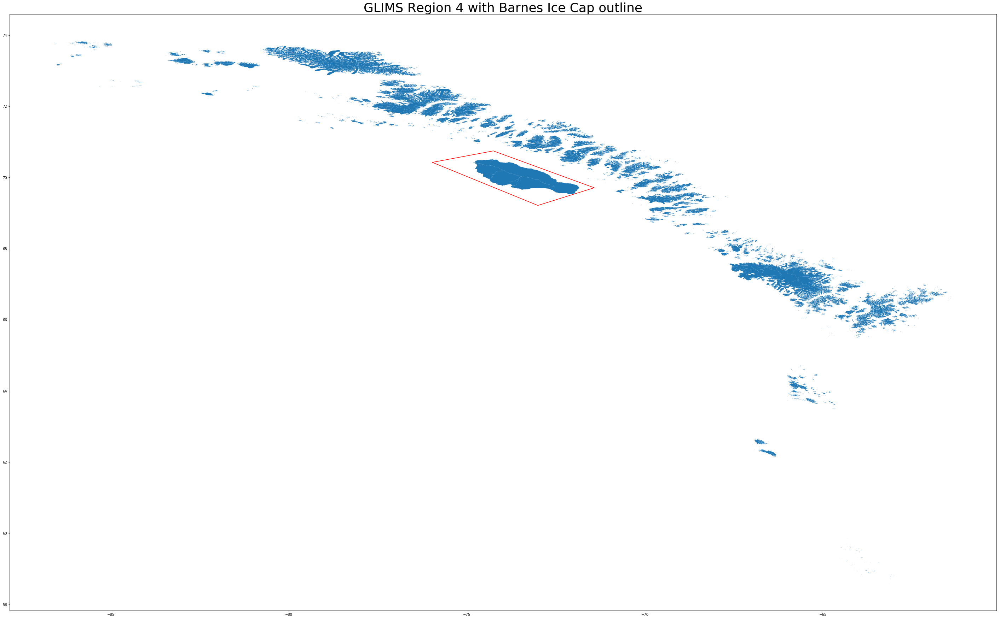

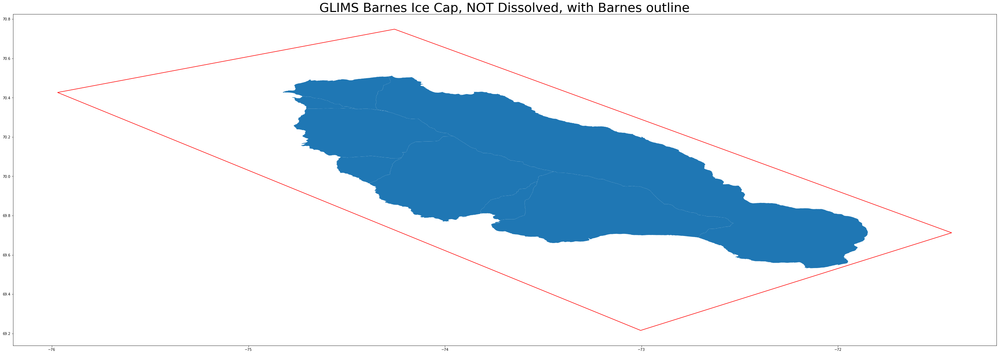

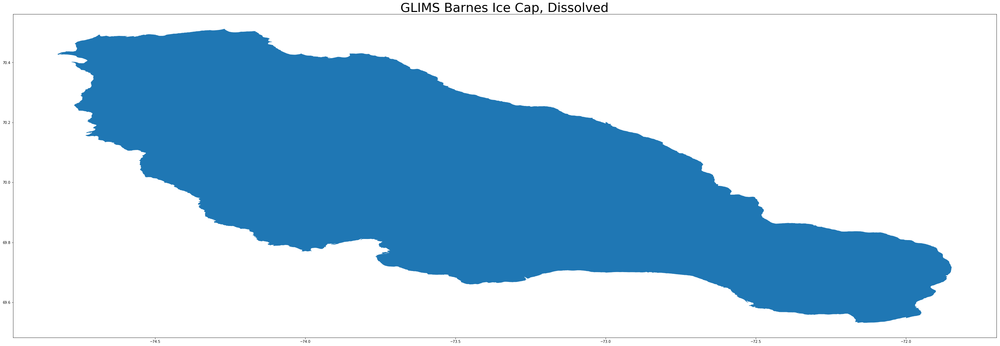

In [39]:
# Plot the barnes ice cap on top of Region 4 to make sure it is correct
fig, ax1 = plt.subplots(figsize=(50, 50))
glims_polygons_r4.plot(ax=ax1)
barnes_gdf.boundary.plot(ax=ax1, color='red')
ax1.set_title("GLIMS Region 4 with Barnes Ice Cap outline", fontsize=36)

# Find the GLIMS outlines that lie within the barnes outline
barnes_glims_pip_mask = ws.pip(glims_polygons_r4, barnes_gdf)

# Pass pip_mask into data to get the ones that are in the specified region
barnes_glims_region = glims_polygons_r4.loc[barnes_glims_pip_mask]

# Plot the GLIMS barnes ice cap with the barnes outline
fig, ax2 = plt.subplots(figsize=(50, 50))
barnes_glims_region.plot(ax=ax2)
barnes_gdf.boundary.plot(ax=ax2, color='red')
ax2.set_title("GLIMS Barnes Ice Cap, NOT Dissolved, with Barnes outline", fontsize=36)

# Dissolve the GLIMS barnes ice cap
barnes_glims_dissolve = barnes_glims_region.dissolve(by="region_no")

# Plot the GLIMS barnes ice cap dissolve
fig, ax3 = plt.subplots(figsize=(50, 50))
barnes_glims_dissolve.plot(ax=ax3)
ax3.set_title("GLIMS Barnes Ice Cap, Dissolved", fontsize=36)

# Determine area of barnes glims dissolve
barnes_glims_area = barnes_glims_dissolve['geometry'].to_crs({'init': 'epsg:3338'}).area/10**6
print("GLIMS Barnes Ice Cap area (km^2)")
print(barnes_glims_area[4])

##### RGI

RGI Barnes Ice Cap area (km^2):
5862.719941177498


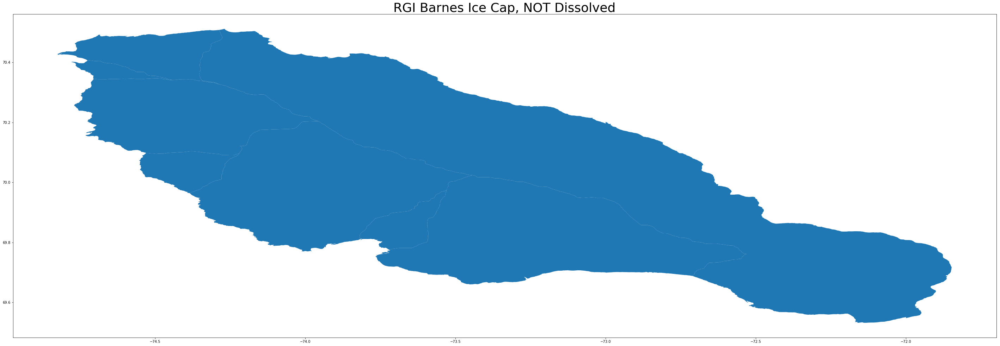

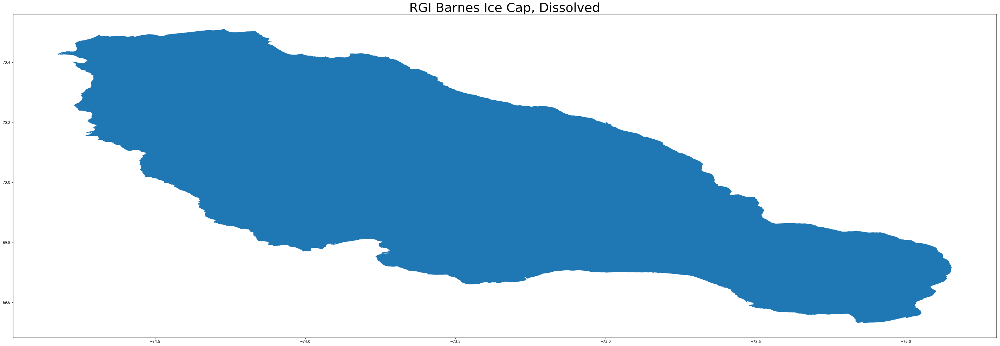

In [45]:
# Find the RGI outlines that lie within the barnes outline
barnes_rgi_pip_mask = ws.pip(rgi_polygons_r4, barnes_gdf)

# Pass pip_mask into data to get the ones that are in the specified region
barnes_rgi_region = rgi_polygons_r4.loc[barnes_rgi_pip_mask]

# Plot the RGI barnes icecap
fig, ax1 = plt.subplots(figsize=(50, 50))
barnes_rgi_region.plot(ax=ax1)
ax1.set_title("RGI Barnes Ice Cap, NOT Dissolved", fontsize=36)

# Dissolve the RGI barnes ice cap
barnes_rgi_dissolve = barnes_rgi_region.dissolve(by="O1Region")

# Plot the RGI barnes ice cap dissolve
fig, ax2 = plt.subplots(figsize=(50, 50))
barnes_rgi_dissolve.plot(ax=ax2)
ax2.set_title("RGI Barnes Ice Cap, Dissolved", fontsize=36)

# Determine area of barnes rgi dissolve
barnes_rgi_area = barnes_rgi_dissolve['geometry'].to_crs({'init': 'epsg:3338'}).area/10**6
print("RGI Barnes Ice Cap area (km^2):")
print(barnes_rgi_area[0])

### Dissolve Penny Ice Cap

##### GLIMS

GLIMS Penny Ice Cap area (km^2)
7109.437844707312


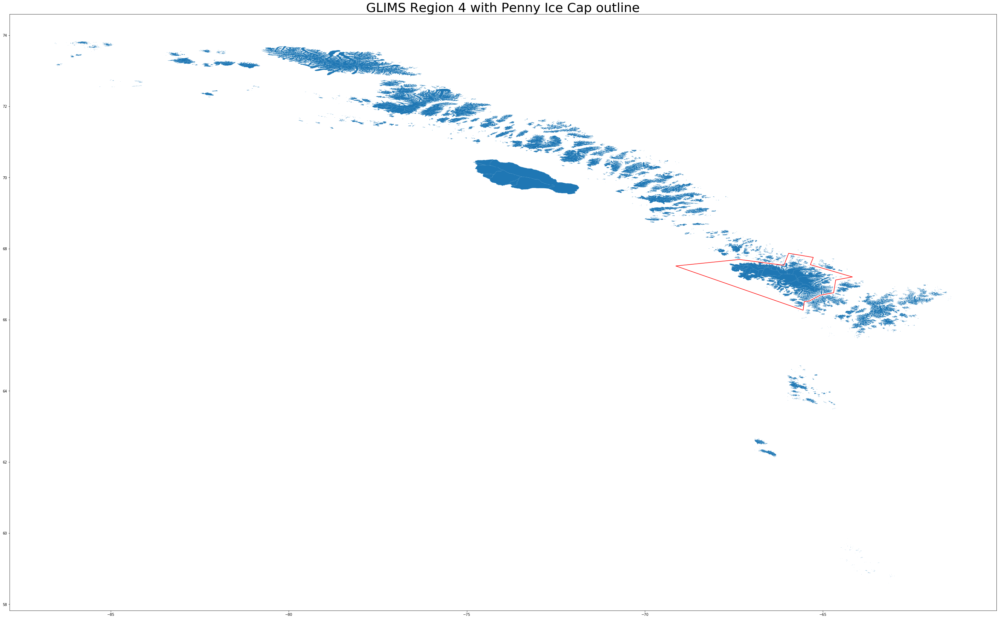

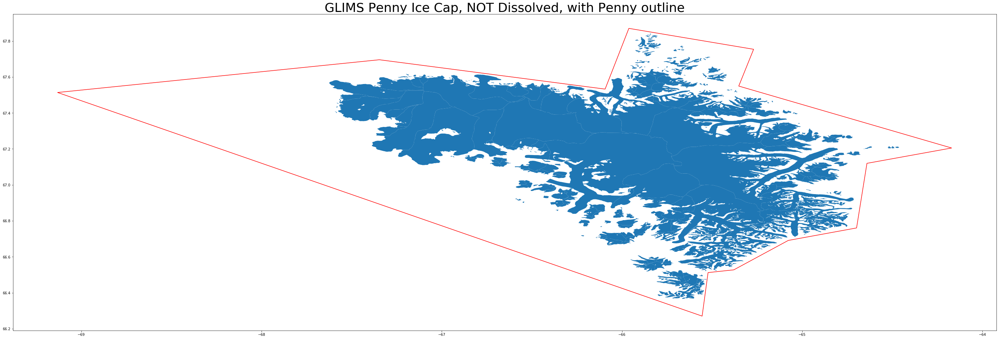

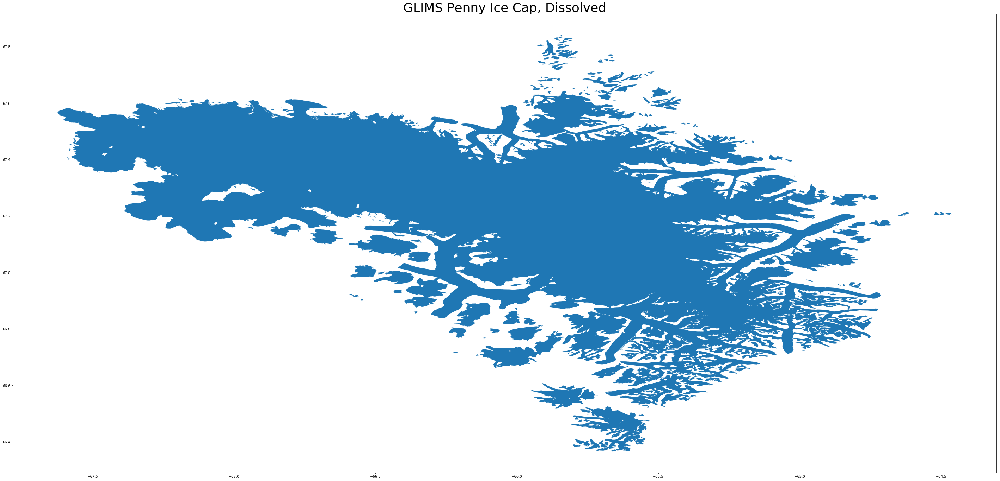

In [47]:
# Plot the penny ice cap on top of Region 4 to make sure it is correct
fig, ax1 = plt.subplots(figsize=(50, 50))
glims_polygons_r4.plot(ax=ax1)
penny_gdf.boundary.plot(ax=ax1, color='red')
ax1.set_title("GLIMS Region 4 with Penny Ice Cap outline", fontsize=36)

# Find the GLIMS outlines that lie within the penny outline
penny_glims_pip_mask = ws.pip(glims_polygons_r4, penny_gdf)

# Pass pip_mask into data to get the ones that are in the specified region
penny_glims_region = glims_polygons_r4.loc[penny_glims_pip_mask]

# Plot the GLIMS penny ice cap with the barnes outline
fig, ax2 = plt.subplots(figsize=(50, 50))
penny_glims_region.plot(ax=ax2)
penny_gdf.boundary.plot(ax=ax2, color='red')
ax2.set_title("GLIMS Penny Ice Cap, NOT Dissolved, with Penny outline", fontsize=36)

# Dissolve the GLIMS penny ice cap
penny_glims_dissolve = penny_glims_region.dissolve(by="region_no")

# Plot the GLIMS penny ice cap dissolve
fig, ax3 = plt.subplots(figsize=(50, 50))
penny_glims_dissolve.plot(ax=ax3)
ax3.set_title("GLIMS Penny Ice Cap, Dissolved", fontsize=36)

# Determine area of penny glims dissolve
penny_glims_area = penny_glims_dissolve['geometry'].to_crs({'init': 'epsg:3338'}).area/10**6
print("GLIMS Penny Ice Cap area (km^2)")
print(penny_glims_area[4])

##### RGI

RGI Penny Ice Cap area (km^2):
7109.438193469843


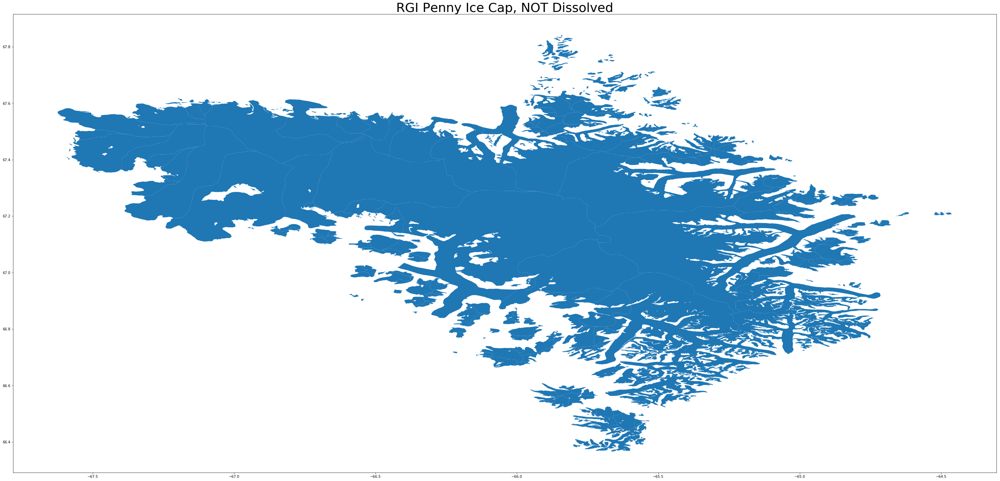

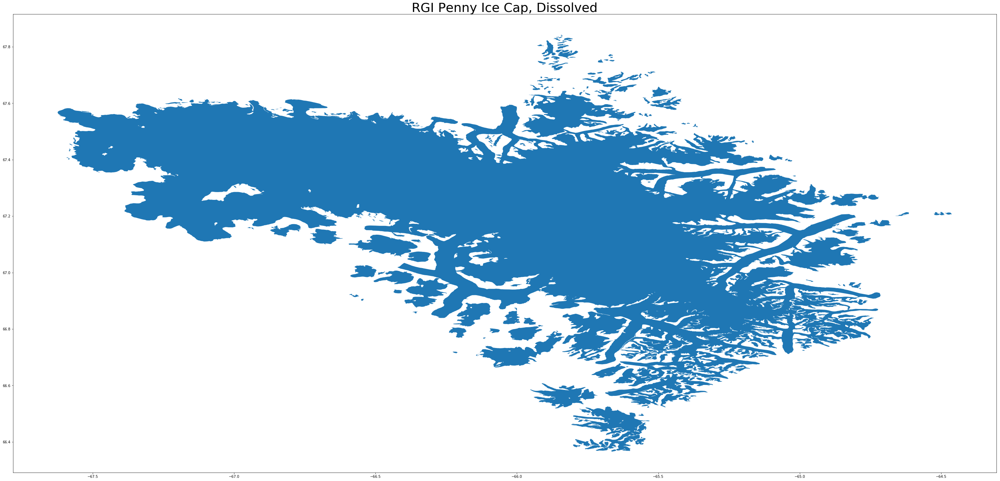

In [48]:
# Find the RGI outlines that lie within the penny outline
penny_rgi_pip_mask = ws.pip(rgi_polygons_r4, penny_gdf)

# Pass pip_mask into data to get the ones that are in the specified region
penny_rgi_region = rgi_polygons_r4.loc[penny_rgi_pip_mask]

# Plot the RGI penny icecap
fig, ax1 = plt.subplots(figsize=(50, 50))
penny_rgi_region.plot(ax=ax1)
ax1.set_title("RGI Penny Ice Cap, NOT Dissolved", fontsize=36)

# Dissolve the RGI penny ice cap
penny_rgi_dissolve = penny_rgi_region.dissolve(by="O1Region")

# Plot the RGI penny ice cap dissolve
fig, ax2 = plt.subplots(figsize=(50, 50))
penny_rgi_dissolve.plot(ax=ax2)
ax2.set_title("RGI Penny Ice Cap, Dissolved", fontsize=36)

# Determine area of penny rgi dissolve
penny_rgi_area = penny_rgi_dissolve['geometry'].to_crs({'init': 'epsg:3338'}).area/10**6
print("RGI Penny Ice Cap area (km^2):")
print(penny_rgi_area[0])

### Dissolve Bylot Island

##### GLIMS

GLIMS Bylot Island area (km^2)
4875.241609055264


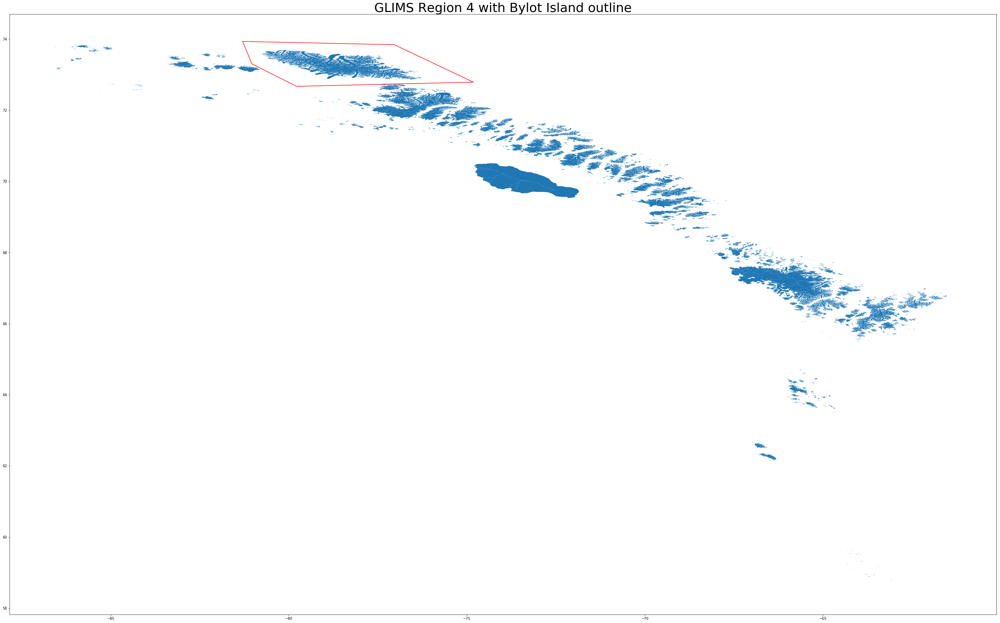

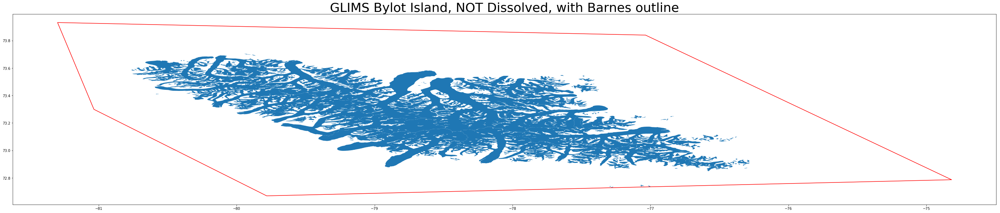

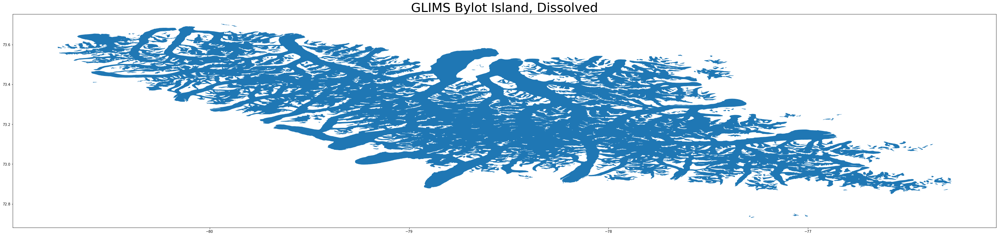

In [55]:
# Plot the bylot island on top of Region 4 to make sure it is correct
fig, ax1 = plt.subplots(figsize=(50, 50))
glims_polygons_r4.plot(ax=ax1)
bylot_gdf.boundary.plot(ax=ax1, color='red')
ax1.set_title("GLIMS Region 4 with Bylot Island outline", fontsize=36)

# Find the GLIMS outlines that lie within the bylot outline
bylot_glims_pip_mask = ws.pip(glims_polygons_r4, bylot_gdf)

# Pass pip_mask into data to get the ones that are in the specified region
bylot_glims_region = glims_polygons_r4.loc[bylot_glims_pip_mask]

# Plot the GLIMS bylot with the barnes outline
fig, ax2 = plt.subplots(figsize=(50, 50))
bylot_glims_region.plot(ax=ax2)
bylot_gdf.boundary.plot(ax=ax2, color='red')
ax2.set_title("GLIMS Bylot Island, NOT Dissolved, with Barnes outline", fontsize=36)

# Dissolve the GLIMS bylot
# The bylot region has some ill formed outlines. Must buffer them first before dissolving
bylot_glims_region['geometry'] = bylot_glims_region.buffer(0)
bylot_glims_dissolve = bylot_glims_region.dissolve(by="region_no")

# Plot the GLIMS bylot dissolve
fig, ax3 = plt.subplots(figsize=(50, 50))
bylot_glims_dissolve.plot(ax=ax3)
ax3.set_title("GLIMS Bylot Island, Dissolved", fontsize=36)

# Determine area of bylot glims dissolve
bylot_glims_area = bylot_glims_dissolve['geometry'].to_crs({'init': 'epsg:3338'}).area/10**6
print("GLIMS Bylot Island area (km^2)")
print(bylot_glims_area[4])

##### RGI

RGI Bylot Island area (km^2):
4875.242384197254


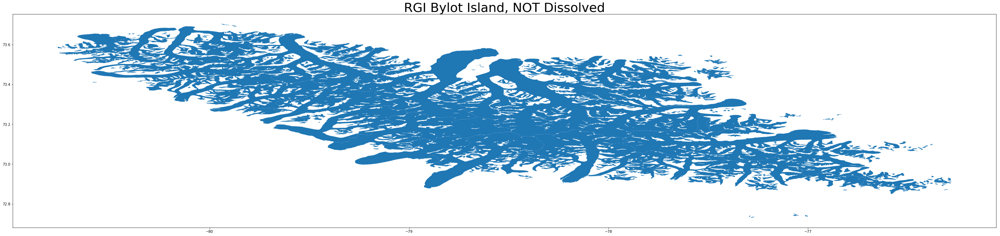

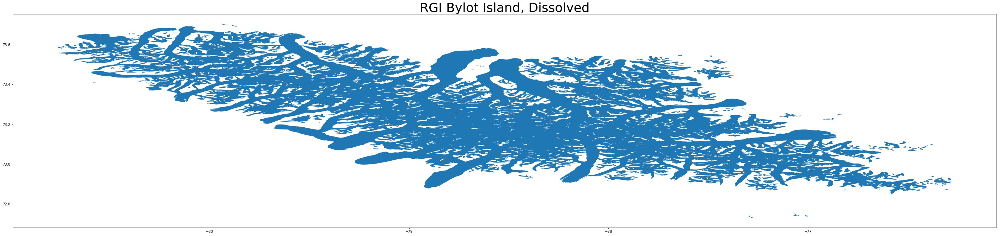

In [56]:
# Find the RGI outlines that lie within the bylot outline
bylot_rgi_pip_mask = ws.pip(rgi_polygons_r4, bylot_gdf)

# Pass pip_mask into data to get the ones that are in the specified region
bylot_rgi_region = rgi_polygons_r4.loc[bylot_rgi_pip_mask]

# Plot the RGI bylot
fig, ax1 = plt.subplots(figsize=(50, 50))
bylot_rgi_region.plot(ax=ax1)
ax1.set_title("RGI Bylot Island, NOT Dissolved", fontsize=36)

# Dissolve the RGI bylot
bylot_rgi_dissolve = bylot_rgi_region.dissolve(by="O1Region")

# Plot the RGI bylot dissolve
fig, ax2 = plt.subplots(figsize=(50, 50))
bylot_rgi_dissolve.plot(ax=ax2)
ax2.set_title("RGI Bylot Island, Dissolved", fontsize=36)

# Determine area of bylot rgi dissolve
bylot_rgi_area = bylot_rgi_dissolve['geometry'].to_crs({'init': 'epsg:3338'}).area/10**6
print("RGI Bylot Island area (km^2):")
print(bylot_rgi_area[0])

#### Save the Region 4 Ice caps
Save both dissolved and not dissolved

##### GLIMS

In [61]:
# Save GLIMS Region 4 dissolved ice caps if they don't already exist
# Save dissolved barnes ice cap
barnes_dis_glims_fp = 'data/glims/processed/ice-caps/dissolved/barnes-dissolved-outline_r4.shp'
if os.path.exists(barnes_dis_glims_fp) == False:
    barnes_glims_dissolve.to_file(driver='ESRI Shapefile', filename=barnes_dis_glims_fp)

# Save dissolved Penny ice cap
penny_dis_glims_fp = 'data/glims/processed/ice-caps/dissolved/penny-dissolved-outline_r4.shp'
if os.path.exists(penny_dis_glims_fp) == False:
    penny_glims_dissolve.to_file(driver='ESRI Shapefile', filename=penny_dis_glims_fp)

# Save dissolved Bylot Island
bylot_dis_glims_fp = 'data/glims/processed/ice-caps/dissolved/bylot-dissolved-outline_r4.shp'
if os.path.exists(bylot_dis_glims_fp) == False:
    bylot_glims_dissolve.to_file(driver='ESRI Shapefile', filename=bylot_dis_glims_fp)

# Save GLIMS Region 4 NOT dissolved ice caps
# Save not dissolved Barnes ice cap
barnes_not_dis_glims_fp = 'data/glims/processed/ice-caps/not-dissolved/barnes-outline_r4.shp'
if os.path.exists(barnes_not_dis_glims_fp) == False:
    barnes_glims_region.to_file(driver='ESRI Shapefile', filename=barnes_not_dis_glims_fp)

# Save not dissolved Penny ice cap
penny_not_dis_glims_fp = 'data/glims/processed/ice-caps/not-dissolved/penny-outline_r4.shp'
if os.path.exists(penny_not_dis_glims_fp) == False:
    penny_glims_region.to_file(driver='ESRI Shapefile', filename=penny_not_dis_glims_fp)

# Save not dissolved Bylot Island
bylot_not_dis_glims_fp = 'data/glims/processed/ice-caps/not-dissolved/bylot-outline_r4.shp'
if os.path.exists(bylot_not_dis_glims_fp) == False:
    bylot_glims_region.to_file(driver='ESRI Shapefile', filename=bylot_not_dis_glims_fp)

##### RGI

In [62]:
# Save RGI Region 4 dissolved ice caps if they don't already exist
# Save dissolved Barnes ice cap
barnes_dis_rgi_fp = 'data/rgi/processed/ice-caps/dissolved/barnes-dissolved-outline_r4.shp'
if os.path.exists(barnes_dis_rgi_fp) == False:
    barnes_rgi_dissolve.to_file(driver='ESRI Shapefile', filename=barnes_dis_rgi_fp)

# Save dissolved Penny ice cap
penny_dis_rgi_fp = 'data/rgi/processed/ice-caps/dissolved/penny-dissolved-outline_r4.shp'
if os.path.exists(penny_dis_rgi_fp) == False:
    penny_rgi_dissolve.to_file(driver='ESRI Shapefile', filename=penny_dis_rgi_fp)

# Save dissolved Bylot Island
bylot_dis_rgi_fp = 'data/rgi/processed/ice-caps/dissolved/bylot-dissolved-outline_r4.shp'
if os.path.exists(bylot_dis_rgi_fp) == False:
    bylot_rgi_dissolve.to_file(driver='ESRI Shapefile', filename=bylot_dis_rgi_fp)

# Save RGI Region 4 NOT dissolved ice caps
# Save not dissolved Barnes ice cap
barnes_not_dis_rgi_fp = 'data/rgi/processed/ice-caps/not-dissolved/barnes-outline_r4.shp'
if os.path.exists(barnes_not_dis_rgi_fp) == False:
    barnes_rgi_region.to_file(driver='ESRI Shapefile', filename=barnes_not_dis_rgi_fp)

# Save not dissolved Penny ice cap
penny_not_dis_rgi_fp = 'data/rgi/processed/ice-caps/not-dissolved/penny-outline_r4.shp'
if os.path.exists(penny_not_dis_rgi_fp) == False:
    penny_rgi_region.to_file(driver='ESRI Shapefile', filename=penny_not_dis_rgi_fp)

# Save not dissolved Bylot Island
bylot_not_dis_rgi_fp = 'data/rgi/processed/ice-caps/not-dissolved/bylot-outline_r4.shp'
if os.path.exists(bylot_not_dis_rgi_fp) == False:
    bylot_rgi_region.to_file(driver='ESRI Shapefile', filename=bylot_not_dis_rgi_fp)

#### Save the Region Ice Cap Sizes

In [66]:
# Save the ice cap sizes in km^2 for both GLIMS and RGI to a csv file
# Create lists of the data to enter into a dataframe
r4_cap_names = ['Barnes Ice Cap', 'Penny Ice Cap', 'Bylot Island']
r4_glims_areas = [barnes_glims_area[4], penny_glims_area[4], bylot_glims_area[4]]
r4_rgi_areas = [barnes_rgi_area[0], penny_rgi_area[0], bylot_rgi_area[0]]
r4_average_areas = [(barnes_glims_area[4]+barnes_rgi_area[0])/2, (penny_glims_area[4]+penny_rgi_area[0])/2, 
                    (bylot_glims_area[4]+bylot_rgi_area[0])/2]

# Write data to a dataframe first
region_4_ice_caps = pd.DataFrame(data=r4_cap_names, index=range(0,3), columns=['Ice Cap Name'])
region_4_ice_caps['GLIMS Area km^2'] = r4_glims_areas
region_4_ice_caps['RGI Area km^2'] = r4_rgi_areas
region_4_ice_caps['Average Area km^2'] = r4_average_areas

# Write dataframe to csv file
region_4_ice_caps_fp = 'data/comparison/region-4-ice-cap-sizes.csv'
if os.path.exists(region_4_ice_caps_fp) == False:
    region_4_ice_caps.to_csv(region_4_ice_caps_fp, index=False)

# ----------------------------------------------------------------------------------------------------
# Region 5 - Greenland Periphery

#### Open GLIMS and RGI Region 5 Data

In [67]:
# Open GLIMS region 5 shapefile
glims_region_5_fp = "data/glims/processed/cleaned/glims_region_5_cleaned.shp"
glims_polygons_r5 = gpd.read_file(glims_region_5_fp)

# Open RGI region 5 shapefile
rgi_polygons_r5 = ws.open_rgi_region(5)

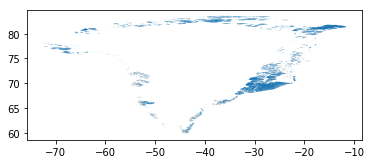

In [68]:
glims_polygons_r5.plot()

## Region 6 - Iceland

In [ ]:
# Open GLIMS region 6 cleaned shapefile
glims_region_6_fp = "data/glims/processed/cleaned/glims_region_6_cleaned.shp"
glims_polygons_r6 = gpd.read_file(glims_region_6_fp)

# Filter by the Vatnakojul icecap
vatnakojul_glims = glims_polygons_r6.loc[glims_polygons_r6['glac_id']=='G343222E64409N']

In [ ]:
vatnakojul_glims.bounds

In [ ]:
# Plot the glims vatnakojul icecap
fig, ax = plt.subplots(figsize=(50, 50))
vatnakojul_glims.plot(ax=ax)
ax.set_axis_off()

In [ ]:
vatnakojul_glims.head()

In [ ]:
# Open RGI region 6 - Alaska
rgi_region06_polygons = ws.open_rgi_region(6)

In [ ]:
# Do initial subset of rgi for the vatnakojul
rgi_vatnakojul_init_subset = rgi_region06_polygons.loc[370:500]
rgi_vatnakojul_init_subset.head()

In [ ]:
# Plot RGI initial vatnakojul subset
fig, ax = plt.subplots(figsize=(20, 20))
rgi_vatnakojul_init_subset.plot(ax=ax)
ax.set_axis_off()

In [ ]:
# Plot RGI Region 6 - Iceland
# Subset for the Vatnakojul Icecap
# Note that rgi initial subset has some extra outlines outside of the vatnakojul icecap - need to remove those
fig, ax = plt.subplots(figsize=(20, 20))
# Underplot GLIMS vatnakojul
vatnakojul_glims.plot(ax=ax)
# Plot RGI vatnakojul intial subset
rgi_vatnakojul_init_subset.plot(ax=ax, color="red")
ax.set_axis_off()

In [ ]:
# Determine where rgi_vatnakojul_init_subset overlaps with vatnakojul_glims
# Note I'm using this method because shapely within, contains, touches, and overlaps all returned false for some reason
# Found this answer on the following stack overflow page: 
# https://gis.stackexchange.com/questions/280535/known-intersecting-polygons-returning-false-for-intersects-in-geopandas
sj = gpd.sjoin(rgi_vatnakojul_init_subset, vatnakojul_glims, how='inner',op='intersects')
aff_vatnakojul_rgi = rgi_vatnakojul_init_subset.geom_almost_equals(sj)
aff_vatnakojul_rgi = aff_vatnakojul_rgi[~aff_vatnakojul_rgi.index.duplicated()]
vatnakojul_rgi_subset = rgi_vatnakojul_init_subset[aff_vatnakojul_rgi]

In [ ]:
vatnakojul_rgi_subset.shape

In [ ]:
# Plot vatnakojul_rgi_subset
fig, ax = plt.subplots(figsize=(50, 50))
vatnakojul_rgi_subset.plot(ax=ax)
ax.set_axis_off()

In [ ]:
# Dissolve the RGI Vatnatkojul area
vatna_dissolve = vatnakojul_rgi_subset.dissolve(by="O1Region")

In [ ]:
# Plot Dissolved RGI Vatnakojul area
fig, ax = plt.subplots(figsize=(50, 50))
vatna_dissolve.plot(ax=ax)
ax.set_axis_off()

In [ ]:
vatna_dissolve

In [ ]:
# Plot RGI Region 6 - Iceland
# Subset for the Vatnakojul Icecap from both GLIMS and RGI dissolve
fig, ax = plt.subplots(figsize=(20, 20))
# Underplot GLIMS vatnakojul
vatnakojul_glims.plot(ax=ax)
# Plot rgi 
vatna_dissolve.plot(ax=ax, color="red")
ax.set_axis_off()

In [ ]:
# print area from database
print("area from database (km2):", vatnakojul_glims['db_area'])
# Calculate area for GLIMS vatnakojul
print(vatnakojul_glims['geometry'].to_crs({'init': 'epsg:3338'}).area/10**6)

In [ ]:
# Calculate area for RGI vatnakojul dissolve
vatna_dissolve['geometry'].to_crs({'init': 'epsg:3338'}).area/10**6

## Extra Code

## Region 1 - Alaska
Didn't need to do any dissolves for Region 1 but started with it since it's region 1 before I knew that I didn't need to dissolve this region. Leaving the code here as examples, but it is not used for this analysis.

In [ ]:
# Open GLIMS region 1 cleaned shapefile
glims_region_1_fp = "data/glims/processed/cleaned/glims_region_1_cleaned.shp"
glims_polygons_r1 = gpd.read_file(glims_region_1_fp)

In [ ]:
# Plot GLIMS Region 1 - Alaska
fig, ax = plt.subplots(figsize=(20, 20))
glims_polygons_r1.plot(ax=ax)
ax.set_axis_off()

In [ ]:
# Open GLIMS region 1 all shapefile
glims_region_1_all_fp = "data/glims/processed/glims_region_1.shp"
glims_polygons_r1_all = gpd.read_file(glims_region_1_all_fp)

In [ ]:
# Dissolve Region 1 glims by rc_id and save to shapefile if it doesn't already exist or open the file if it does
# Note: Turns out that rc_id is the id for the institution that created the outline, so dissolving by that isn't useful
dissolve_fp = "data/glims/processed/dissolved/glims_region_1_dissolve.shp"
if os.path.exists(dissolve_fp) == False:
    # Buffer first in case there are any outlines that aren't closed then dissolve
    glims_polygons_r1_all['geometry'] = glims_polygons_r1_all.buffer(0)
    glims_dissolve = glims_polygons_r1_all.dissolve(by="rc_id")
    # Save region 1 dissolve to a shapefile
    glims_dissolve.to_file(driver='ESRI Shapefile', filename=dissolve_fp)
else:
    # File exists, so open it
    glims_dissolve = gpd.read_file(dissolve_fp)

In [ ]:
glims_dissolve.shape

In [ ]:
# Plot Region 1 dissolve
fig, ax = plt.subplots(figsize=(20, 20))
glims_dissolve.plot(ax=ax)
ax.set_axis_off()

## Region 19 - Antarctica

In [ ]:
# Open GLIMS region 19 cleaned shapefile
glims_region_19_fp = "data/glims/processed/cleaned/glims_region_19_cleaned.shp"
glims_polygons_r19 = gpd.read_file(glims_region_19_fp)

In [ ]:
# Plot Region 19 - Anarctica
fig, ax = plt.subplots(figsize=(50, 50))
glims_polygons_r19.plot(ax=ax)
ax.set_axis_off()